In [1]:
%load_ext autoreload
%autoreload 2
path_to_tissue_tag = '/lustre/scratch126/cellgen/team205/ny1/tissuetag/'

# init and load image - visium tutorial

In [2]:
import os
import numpy as np 
from bokeh.plotting import show, output_notebook
import pandas as pd
import socket
os.chdir(path_to_tissue_tag)
import tissue_tag as tt
import matplotlib.pyplot as plt
import scanpy as sc
output_notebook()
host = '5016'

Loading BokehJS ...

# Step 1 - Load image and define annotation names and colors 

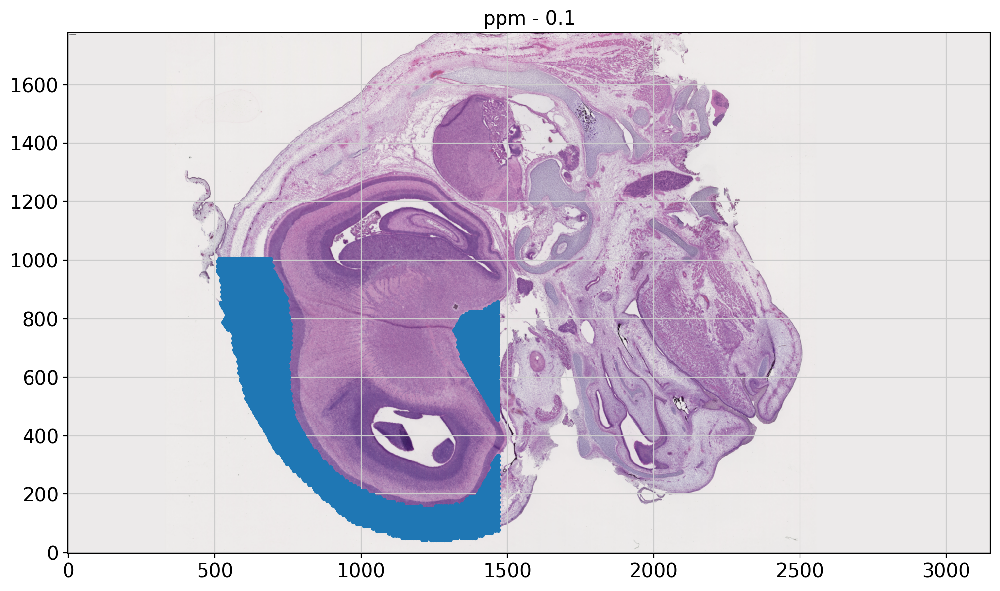

In [26]:
plt.figure(figsize=[12,12])
vis_path = '/lustre/scratch126/cellgen/team205/kt21/spaceranger/cytassist_1/spaceranger201_count_47058_HCA_BN_F13657028_GRCh38-2020-A_v3/'
im,ppm,df = tt.read_visium(spaceranger_dir_path=vis_path,use_resolution='hires',res_in_ppm=0.1,header=0)

In [27]:
# define annotations Lv0 
annodict = {
    'unassigned':'gray',
    'skin':'orange',
    'suture_zone_0':'yellow',
    'suture_zone_1':'cyan',
    'suture_zone_2':'green',
 #   '':'black',
    'osteo_zone_1':'brown',
    'osteo_zone_2':'magenta',
    'osteo_zone_3':'blue',
    'osteo_zone_4':'red',
 #   'Other':'orange',
}

In [63]:
# optional if not going for step 2 bypass classifier 
result = np.zeros(im.shape[:2], dtype=np.uint8)

# Step 2 - (optional) Predict regions from image

In [28]:
# generate automated labels from markers

# these marker genes would be used to train the classifier in later stages or just to define the annotations if going with the manual option 
gene_markers = { 
    'suture_zone_0':'ALX1',
    'suture_zone_1':'HHIP',
    'suture_zone_2':'ERM',
    'osteo_zone_1':'SPP1',
}

labels_per_marker = { # how many spots per marker gene
    'suture_zone_0':100,
    'suture_zone_1':100,
    'suture_zone_2':100,
    'osteo_zone_1':100,
}
r = 100

/nfs/team205/ny1/miniconda/miniconda3/envs/imagespot_tester/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


ALX1
HHIP
ERM


/nfs/team205/ny1/miniconda/miniconda3/envs/imagespot_tester/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/nfs/team205/ny1/miniconda/miniconda3/envs/imagespot_tester/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


SPP1


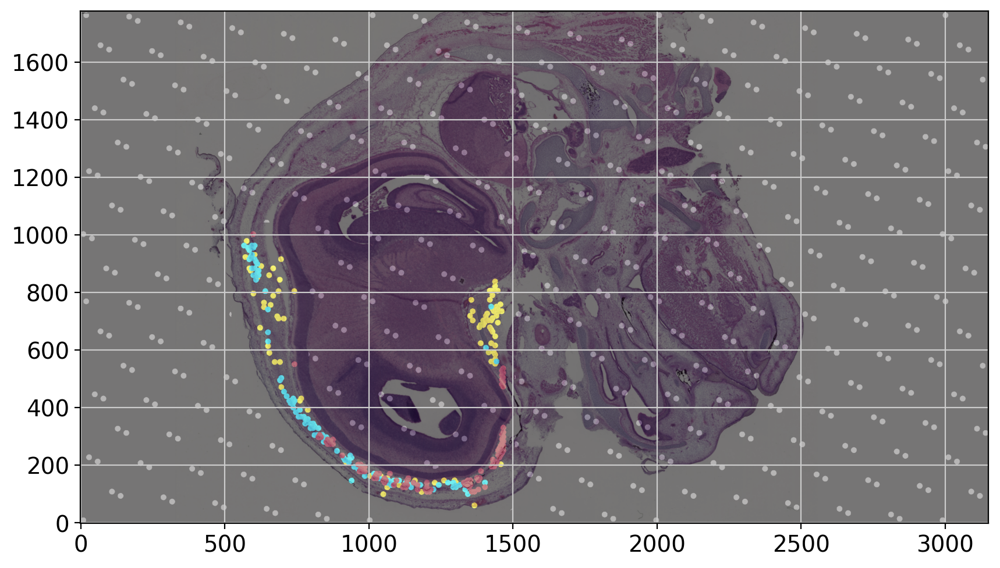

In [29]:
adata = sc.read_visium(vis_path,count_file='raw_feature_bc_matrix.h5')
adata = adata[df.index.intersection(adata.obs.index)]
training_labels = tt.background_labels(im.shape[:2],np.vstack((df['pxl_col'],df['pxl_row'])),every_x_spots = 100,r=r*ppm) # generate background labels 
training_labels_rgb = tt.rgb_from_labels(training_labels,colors=list(annodict.values()))
training_labels = tt.gene_labels(adata,df,training_labels,gene_markers,annodict,r*ppm,labels_per_marker)
training_labels_rgb = tt.rgb_from_labels(training_labels,colors=list(annodict.values()))
out = tt.overlay_labels(im,training_labels_rgb,alpha=0.5)

scribble initial annotations or add to predicted annotations

In [31]:
p, render_dict = tt.scribbler(im,annodict)
def app(doc):
    global p
    doc.add_root(p)

import socket
show(app,notebook_url=f'{socket.gethostname()}:'+host) # determine if working on a server or local environment, if working on a local pc - 'local', while working on server instance indicate the port number e.g. 5011 (string)
print('wait for it.. can take a few tens of seconds on farm...')

wait for it.. can take a few tens of seconds on farm...


## plot scribble anotations  

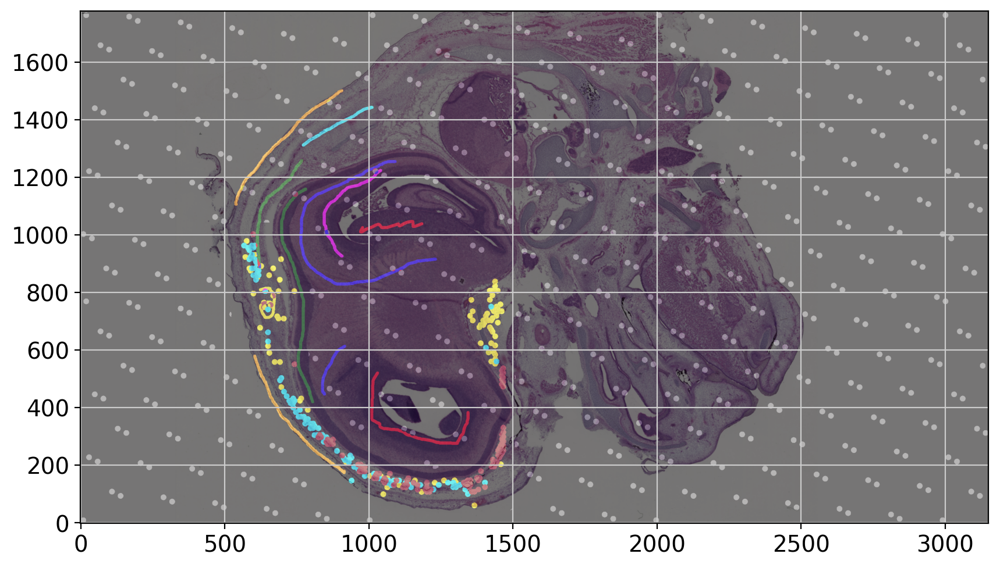

In [32]:
line_width = 100 # microns
training_labels_scrib = tt.scribble_to_labels(im,render_dict,line_width=line_width*ppm)
training_labels = training_labels + training_labels_scrib
training_labels_rgb = tt.rgb_from_labels(training_labels,colors=list(annodict.values()))
out = tt.overlay_labels(im,training_labels_rgb,alpha=0.5)

## run the RF classifier 

CPU times: user 39.4 s, sys: 6.47 s, total: 45.8 s
Wall time: 15.4 s


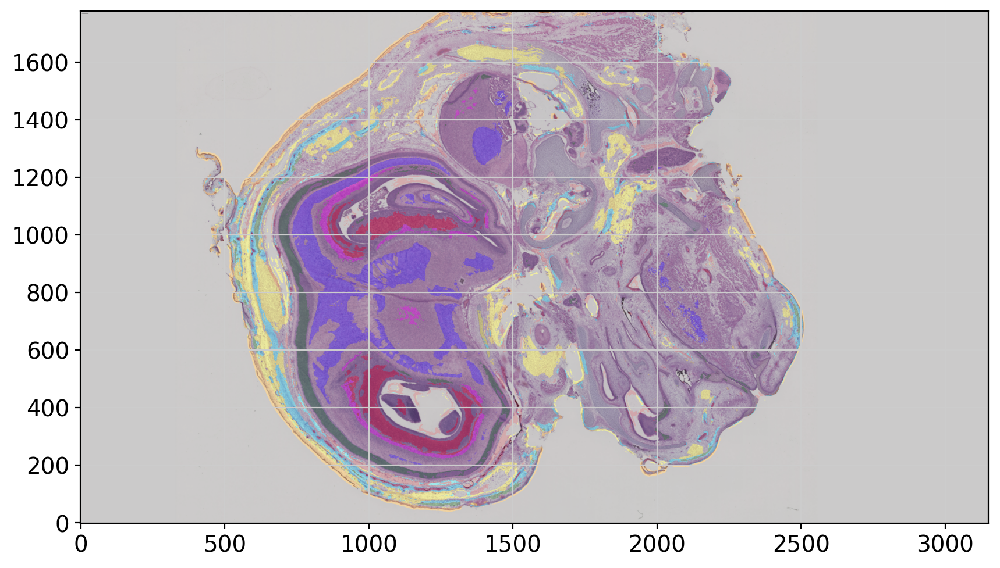

In [33]:
%%time
# this step takes about 30s to 5 min depending on number of training areas and resolution  
result = tt.sk_rf_classifier(im,training_labels)
# plot result 
result_rgb = tt.rgb_from_labels(result,colors=list(annodict.values()))
out_img = tt.overlay_labels(im,result_rgb,alpha=0.7)

# Step 3 - Manually draw annotations or Correct forest annotations (Step 2)

In [49]:
# at this stage, if you are adding annotations make sure they come after the current ones otherwise it will mess up everything
result_rgb = tt.rgb_from_labels(result,colors=list(annodict.values()))
out_img = tt.overlay_labels(im,result_rgb,alpha=0.5,show=False)
tabs,render_dict = tt.annotator(im,out_img,anno_dict=annodict)
# plotting
def app(doc):
    global tabs
    doc.add_root(tabs)
show(app,notebook_url=f'{socket.gethostname()}:'+host)
print('wait for it.. can take a few tens of seconds on farm... (double time of the former plot)')

wait for it.. can take a few tens of seconds on farm... (double time of the former plot)


## update annotations 

In [245]:
out_img, result = tt.update_annotator(im,result,anno_dict=annodict,render_dict=render_dict,alpha=0.5)

## done? great. not done? return to Step 3 and repeat until happy :) 

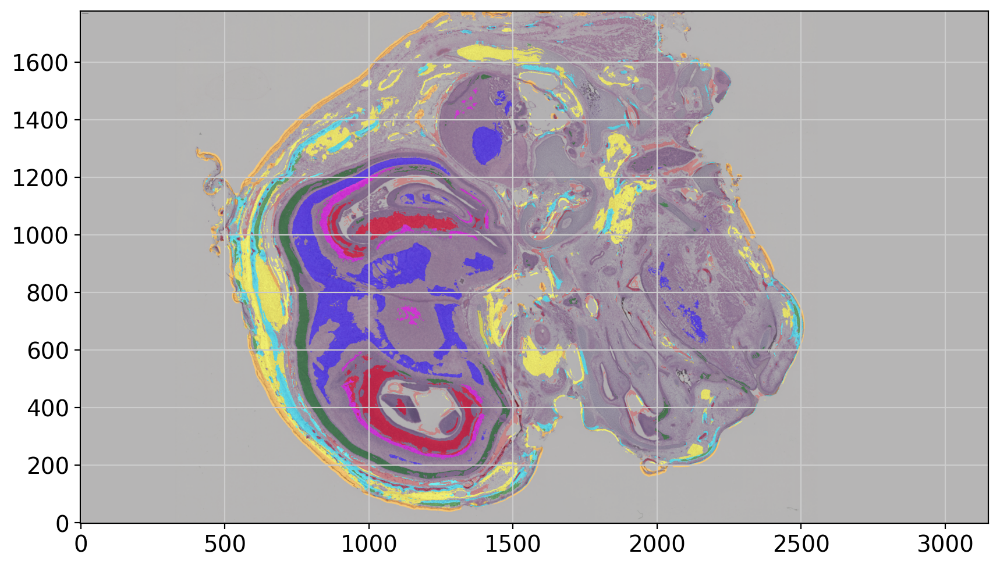

In [34]:
# plot result 
result_rgb = tt.rgb_from_labels(result,colors=list(annodict.values()))
out_img = tt.overlay_labels(im,result_rgb,alpha=0.5)

## save annotation 

In [35]:
isExist = os.path.exists(vis_path+'tissue_annotations')
if not(isExist):
    os.mkdir(vis_path+'/tissue_annotations/')
    
tt.save_annotation(
    folder=vis_path+'/tissue_annotations/',
    label_image=result,
    file_name='annotations_nonsense',
    anno_names=list(annodict.keys()),
    anno_colors=list(annodict.values()),
    ppm = ppm
)

# Step 4 - move annotations to anndata

## load annotations

loaded annotation image - annotations_level_0 size - (1778, 3151)
loaded annotations
{1: 'suture_zone_0', 2: 'suture_zone_1', 3: 'suture_zone_2', 4: 'osteo_zone_1', 5: 'osteo_zone_2', 6: 'osteo_zone_3', 7: 'osteo_zone_4'}
loaded ppm
{'ppm': 0.1}
loaded color annotations
{'suture_zone_0': 'yellow', 'suture_zone_1': 'cyan', 'suture_zone_2': 'green', 'osteo_zone_1': 'brown', 'osteo_zone_2': 'magenta', 'osteo_zone_3': 'blue', 'osteo_zone_4': 'red'}


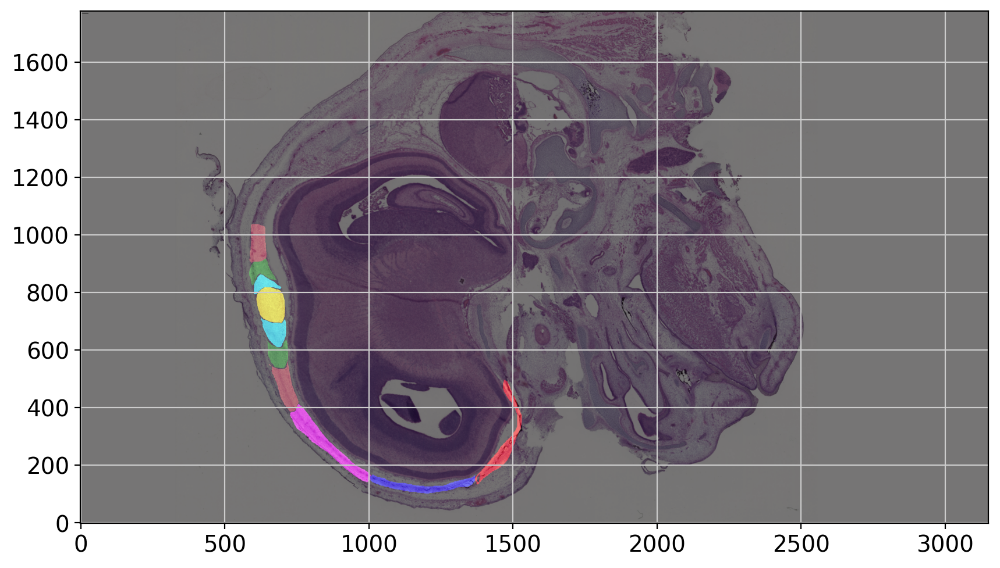

In [50]:
# load tissue annotations from tissue-tag
annotations_level_0,annotations_level_0_labels,ppm,annodict = tt.load_annotation(vis_path+'/tissue_annotations/','annotations_level_0',load_colors=True)
im,ppm,positions = tt.read_visium(spaceranger_dir_path=vis_path+'/',use_resolution='hires',res_in_ppm=ppm, header=0,plot=False)
annotations_level_0_labels[0] = 'unassigned'

result_rgb = tt.rgb_from_labels(annotations_level_0,colors=list(annodict.values()))
out_img = tt.overlay_labels(im,result_rgb,alpha=0.5)


## migrate annotations to hi res grid sapce 


In [51]:
%%time
# it's critical not to split cell part and recalculate the df everytime you cahnge the dist2cluster resolution - I have an overflow bug somewhere that I need to fix
spot_diameter = 50 # don't go crazy here avoid under 15um spots 
df = tt.grid_anno(
    im,
    [annotations_level_0],
    ['annotations_level_0'],
    [annotations_level_0_labels],
    spot_diameter=spot_diameter,
    ppm_in=ppm,
    ppm_out=ppm,
)
df

generating grid with spot size - 50, with resolution of - 0.1 ppm
annotations_level_0


224280it [00:31, 7086.15it/s]


CPU times: user 31.7 s, sys: 169 ms, total: 31.9 s
Wall time: 31.9 s


,x,y,annotations_level_0,annotations_level_0_number
index,,,,
0,5.0,5.000000,unassigned,0
1,5.0,9.980282,unassigned,0
2,5.0,14.960564,unassigned,0
3,5.0,19.940845,unassigned,0
4,5.0,24.921127,unassigned,0
...,...,...,...,...
224275,3146.0,1755.578857,unassigned,0
224276,3146.0,1760.559204,unassigned,0
224277,3146.0,1765.539429,unassigned,0


In [52]:
# remove background spots if you are not interested in it!
df = df.iloc[np.where(df['annotations_level_0']!='unassigned')[0],:]

calculating distances
calculating distance matrix
osteo_zone_1
osteo_zone_2
osteo_zone_3
osteo_zone_4
suture_zone_0
suture_zone_1
suture_zone_2


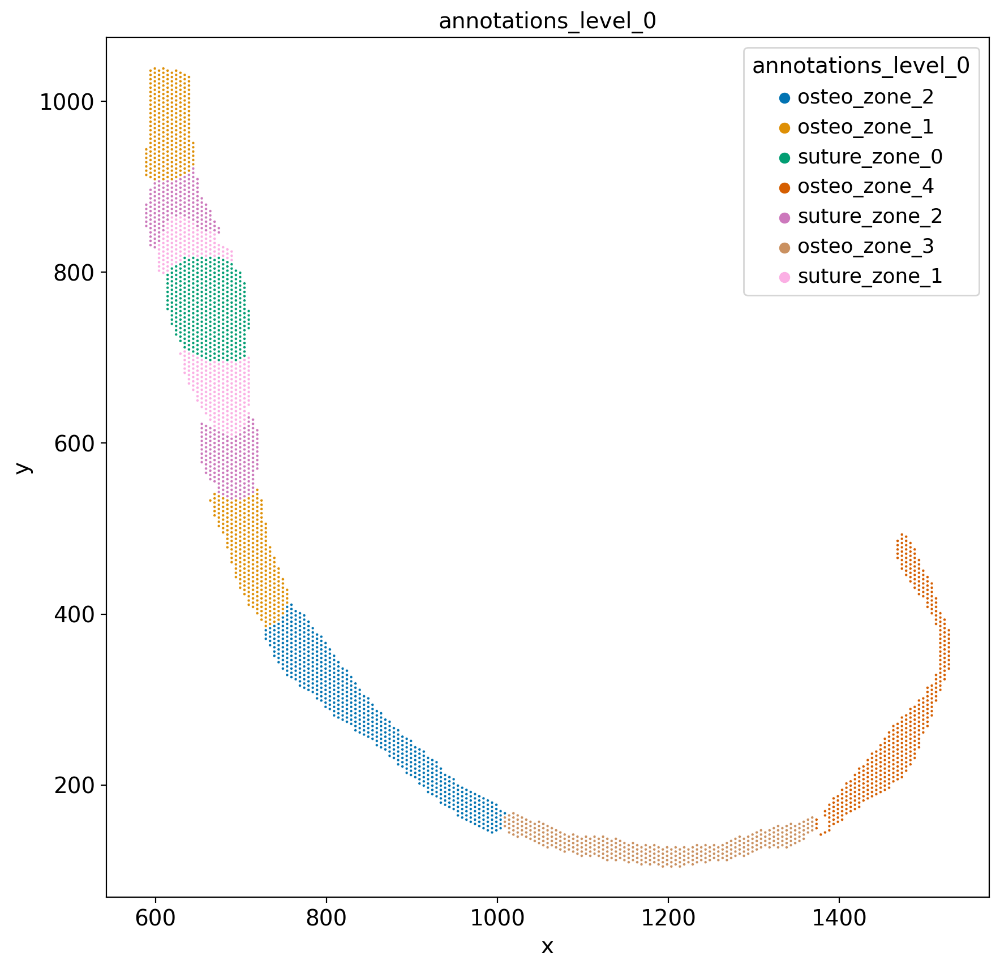

In [53]:
print('calculating distances')
tt.dist2cluster(df,annotation='annotations_level_0',KNN=1,ppm=ppm) # calculate minimum median distance of each spot to clusters 
tt.plot_grid(df,annotation='annotations_level_0',figsize=[10,10],spotsize=3)

## move annotation and distances to visium spots 

Make sure the coordinate systems are aligned, e.g., axes are not flipped.


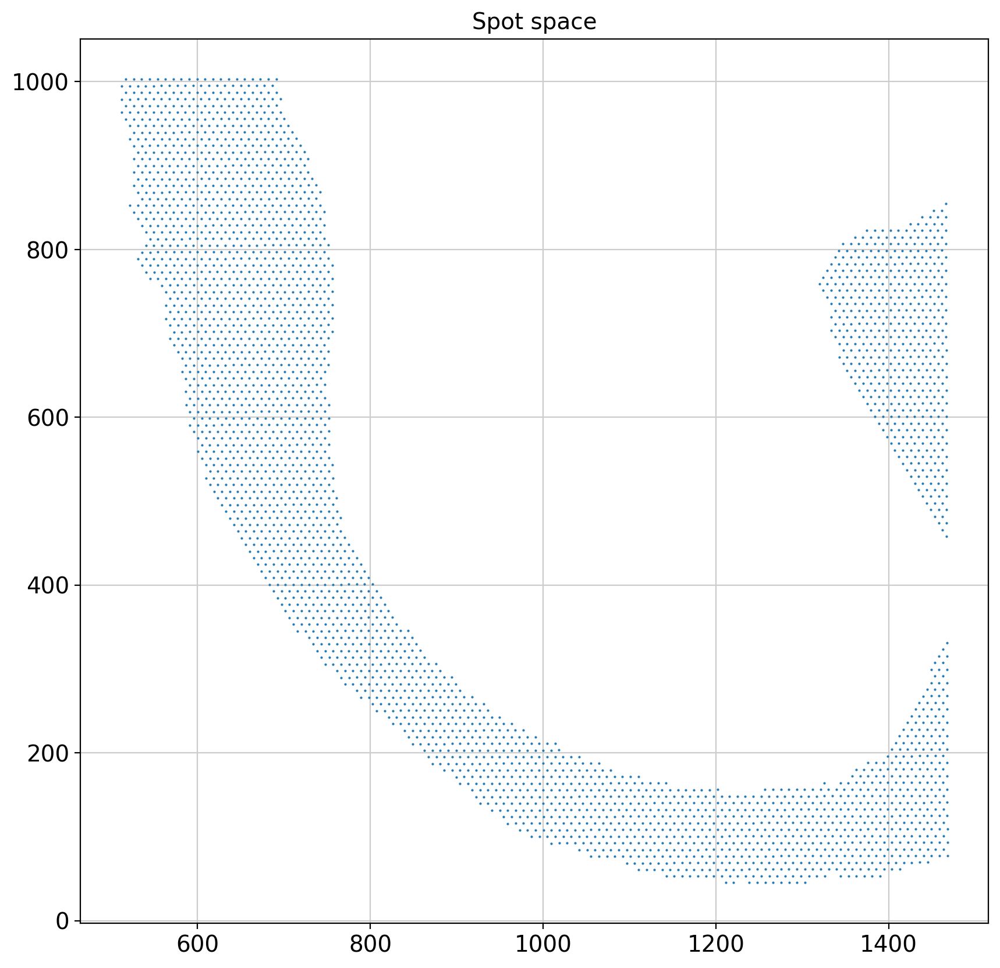

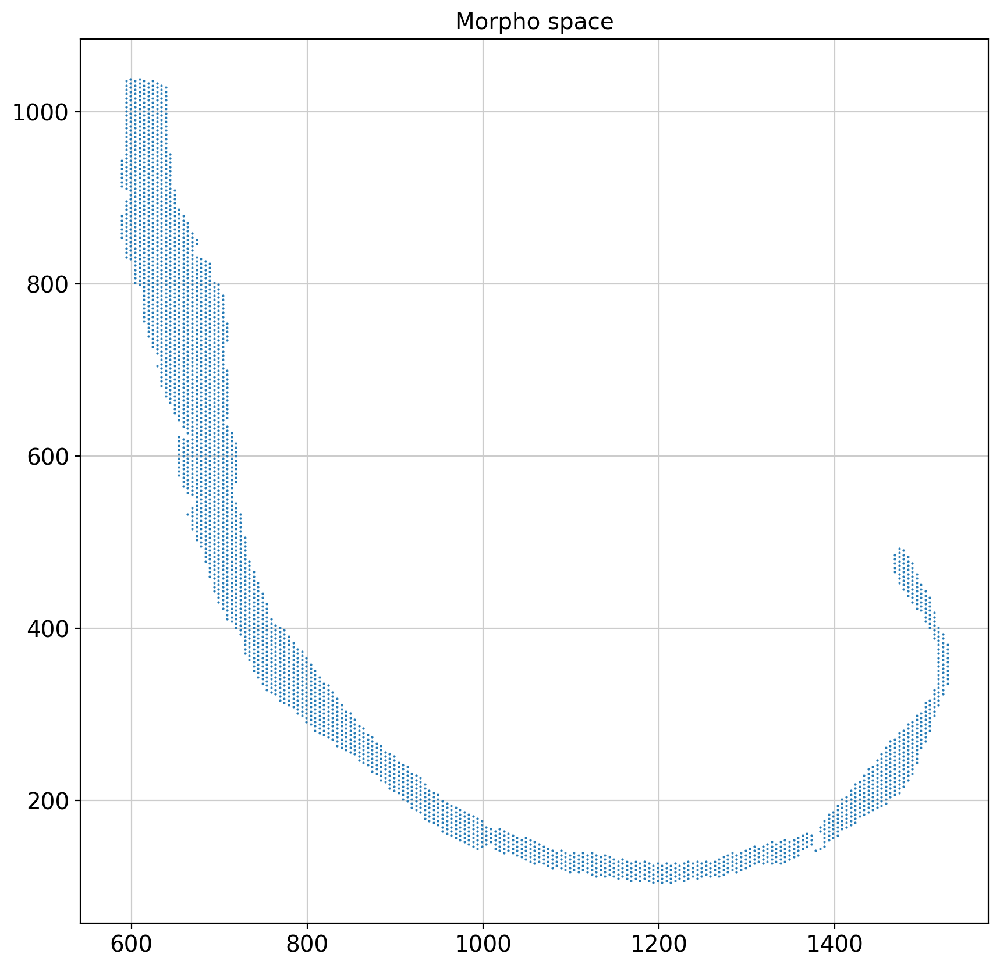

Migrating - annotations_level_0 to segmentations.
Migrating - annotations_level_0_number to segmentations.
Migrating - L2_dist_annotations_level_0_osteo_zone_1 to segmentations.
Migrating - L2_dist_annotations_level_0_osteo_zone_2 to segmentations.
Migrating - L2_dist_annotations_level_0_osteo_zone_3 to segmentations.
Migrating - L2_dist_annotations_level_0_osteo_zone_4 to segmentations.
Migrating - L2_dist_annotations_level_0_suture_zone_0 to segmentations.
Migrating - L2_dist_annotations_level_0_suture_zone_1 to segmentations.
Migrating - L2_dist_annotations_level_0_suture_zone_2 to segmentations.


,in_tissue,array_row,array_col,pxl_row_in_fullres,pxl_col_in_fullres,pxl_col,pxl_row,annotations_level_0,annotations_level_0_number,L2_dist_annotations_level_0_osteo_zone_1,L2_dist_annotations_level_0_osteo_zone_2,L2_dist_annotations_level_0_osteo_zone_3,L2_dist_annotations_level_0_osteo_zone_4,L2_dist_annotations_level_0_suture_zone_0,L2_dist_annotations_level_0_suture_zone_1,L2_dist_annotations_level_0_suture_zone_2
barcode,,,,,,,,,,,,,,,,
CTATACGAGTAGAACA-1,1,6,36,453.187835,13030.610802,1303.061080,45.318783,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GGTAGTTGAGCCTGAA-1,1,6,38,453.187835,12938.804795,1293.880479,45.318783,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CTGGCACCTTCGCCAG-1,1,6,40,453.187835,12847.833388,1284.783339,45.318783,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ATTGTTACCTGAGGAC-1,1,6,42,453.187835,12756.027381,1275.602738,45.318783,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CTTAATTAATGGAACG-1,1,6,44,452.353235,12664.221374,1266.422137,45.235323,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GCCGTATGCGACAGGC-1,1,127,199,10030.223571,5537.571426,553.757143,1003.022357,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CAGCTCGGCGTTGGTG-1,1,127,201,10030.223571,5446.600019,544.660002,1003.022357,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CTTCTAACTCTACTCG-1,1,127,203,10029.388971,5354.794012,535.479401,1002.938897,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [54]:
# calculate distance matrix between hires and visium spots
positions = tt.anno_to_visium_spots(
    df_spots=positions,
    df_grid=df,
    ppm = ppm,
    max_distance=3,
)
positions

/nfs/team205/ny1/miniconda/miniconda3/envs/imagespot_tester/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


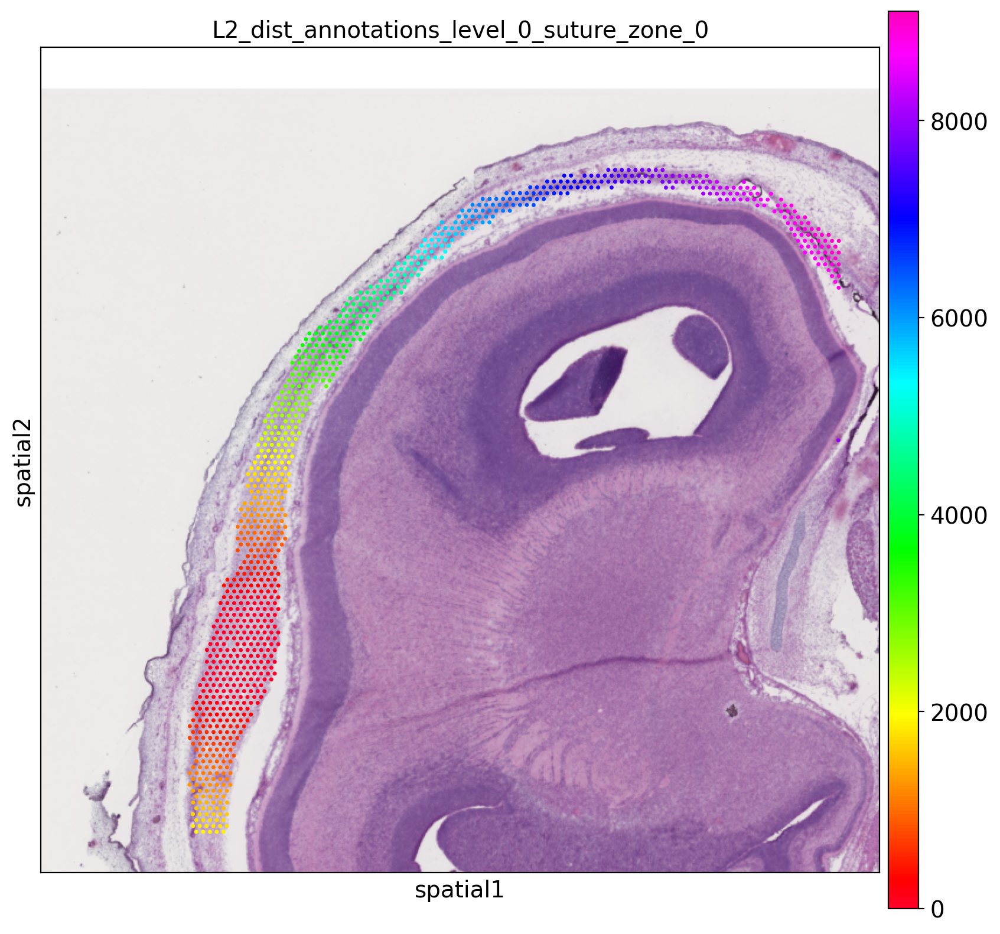

In [56]:
import scanpy as sc
sc.set_figure_params(figsize=[10,10],dpi=50)
adata_vis = sc.read_visium(vis_path,count_file='raw_feature_bc_matrix.h5')
adata_vis.obs = pd.concat([adata_vis.obs,positions],axis=1)
adata_vis.obsm['spatial'] = adata_vis.obsm['spatial'].astype('int')
sc.set_figure_params(figsize=[10,10],dpi=100)
sc.pl.spatial(adata_vis,color=['L2_dist_annotations_level_0_suture_zone_0'],cmap='gist_rainbow',ncols=2,wspace=0.25)

In [59]:
adata_vis.write("/lustre/scratch126/cellgen/team205/kt21/spaceranger/cytassist_1/nadav_notebook/nadav_anno_v1_test.h5ad")